# Ahmad Ossama Ahmad 18P6575
# Maryam Mohamed Abdelrahman 18P8171

# support vector machine 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score,roc_curve,f1_score, roc_auc_score

after searching through the features we removed the following

1. **sym 5** : as all of them have the same number (3) except for three records which are considered variances or outliars thus                having no effect on the result
2. **sym 6** : as all of them have the same number (1) except for one record which is considered a variance or an outliar thus                having no effect on the result
3. **vis_whan** :garbage in garbage out visiting a place does not mean that you didn't quarantine in the place and take all the necessary precautions to not get infected with covid-19
4. **sym 2,3,4** : the outcome is not affected by these features


In [2]:
df = pd.read_csv('data.csv',index_col = 0)  
df = df.iloc[: , 0:]
df = df[["location","gender","age","symptom1","diff_sym_hos", "result"]]


import category_encoders as ce
# encode remaining variables with one-hot encoding

encoder = ce.OneHotEncoder(cols=['gender','location'])
df = encoder.fit_transform(df)

df=(df-df.min())/(df.max()-df.min())


Y = df['result']
X = df.drop(columns = ['result']).copy()
X

,location_1,location_2,location_3,location_4,location_5,location_6,location_7,location_8,location_9,location_10,...,location_136,location_137,location_138,location_139,gender_1,gender_2,gender_3,age,symptom1,diff_sym_hos
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.680851,0.583333,0.65
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.574468,0.583333,0.25
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.468085,0.583333,0.90
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.617021,0.583333,0.25
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.595745,0.583333,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.234043,0.583333,0.25
859,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.351064,0.583333,0.25
860,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.504255,0.583333,0.25
861,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.504255,0.583333,0.25


In [3]:

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.1, random_state = 101,stratify=Y)


### The kernel function can be any of the following:



•	linear (x, x').

•	polynomial: (y(x, x') + r)^d, where d is specified by parameter degree, r by coef0.

•	rbf: exp(-y||x — x'||^2), where y is specified by parameter gamma, must be greater than 0.

•	sigmoid tanh(y(x, x') + r), where r is specified by coef0.



Different kernels are specified by the kernel parameter:

In [4]:
KFolds = KFold(n_splits = 15, shuffle = True, random_state = 101)

from sklearn.utils.fixes import loguniform

# defining parameter range
#param_grid = {'C': [0.1, 1, 10, 100, 1000],'gamma': [1, 0.1, 0.01, 0.001, 0.0001],'kernel': ['rbf']}

param_grid = [
  {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear']},
    
  {'C': [0.1, 1, 10, 100, 1000],'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
   'kernel': ['rbf'],'class_weight':['balanced', None]},
    
  {'C': [0.1, 1, 10, 100, 1000],'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
   'kernel': ['poly'],'degree':['balanced', None],'coef0':[1,2,3,4,5,6,7,8,9,10]},
    
  {'C': [0.1, 1, 10, 100, 1000],'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
   'kernel': ['sigmoid'],'class_weight':['balanced', None],'coef0':[1,2,3,4,5,6,7,8,9,10]},
 ]


grid = GridSearchCV(SVC(probability=True), param_grid, refit = True, verbose = 3, cv=KFolds)

# fitting the model for grid search
grid.fit(X_train, y_train)

# print best parameter after tuning
print(grid.best_params_)

# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)


Fitting 15 folds for each of 1055 candidates, totalling 15825 fits
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.904, total=   0.2s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.846, total=   0.2s
[CV] C=0.1, kernel=linear ............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV] ................ C=0.1, kernel=linear, score=0.904, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.808, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.885, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.865, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.904, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.885, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.904, total=   0.2s
[CV] C=0.1, kernel=linear ............................................
[CV] .

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=1, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=1, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=1, degree=None, gamma=1, kernel=poly, score=n

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=1, kern

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=2, degree=balanced,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=2, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=0.1, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, t

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=2, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=2, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV] C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.1, kernel

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=3, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=3, degree=ba

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=3, degree=None, gamma=0.01, kernel=poly, score

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=3, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=3, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=4, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=4, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=4, degree=None, gamma=1, kernel=poly

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV] C=0.1, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.001, kernel=poly 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=4, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=5, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=5, degree=b

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=1, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=6, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=6, degree=bal

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=6, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=1, kernel=po

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=7, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=7, degree=None, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.001, kernel=poly, s

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=7, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.1, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=8, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=0.1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=8, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=8, degree=None, gamma=0.0001, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=0.1, coef0=9, degree=balanced, gamm

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=0.1, coef0=9, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=0.1, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=0.1, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=0.1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=1, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=0.1, coef0=10, degree=balanced, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=0.1, coef0=10, degree=b

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=0.1, coef0=10,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=0.1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.01, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=0.1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=0.1, coef0=10, degree=None, gamma=0.000

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.01, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=1, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=1, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=2, degree=balanced, gam

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=2, degree=None, gamma=0.0001, kernel=poly, score

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.01, kernel

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, to

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=3, degree=None, gamma=0.0001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.1, kernel=poly,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.01, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=4, degree=balanced, gam

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=4, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.001

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=5, degree=balanced, gam

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV]

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=5, degree=None, gamma=0.0001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.01, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=6, degree=balanced, gamma=0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=6, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.01, kernel=p

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=7, degree=None, gamma=1, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, tota

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=7, degree=None, gamma=0.0001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.1, kernel=poly, sc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.01, kernel=poly ..........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.01, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=8, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=8, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=1, kernel=poly .............
[CV]  C=1, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.1, kernel=poly ...........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.001, kernel=poly .........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ........
[CV]  C=1, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=1, kernel=poly .................
[CV]  C=1, coef0=9, degree=None, gamma=1

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.1, kernel=poly ...............
[CV]  C=1, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.01, kernel=poly ..............
[CV]  C=1, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.001, kernel=poly .............
[CV]  C=1, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, tota

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly ............
[CV]  C=1, coef0=9, degree=None, gamma=0.0001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=1, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.1, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=1, coef0=10, degree=balanced, gamma=0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=1, coef0=10, degree=balanc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=1, kernel=poly ................
[CV]  C=1, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=1, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, t

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1, coef0=10, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=1, coef0=10, degree=None, gamma=0.001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=1, degree=balanced, gamma=1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.01, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=1, degree=balanced, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV] C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=1, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=1, degree=None, gamma=0.001, kernel=poly, score=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=1, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=1, degree=None, gamma=0.0001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.1, kerne

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=2, degree=balanced, gamma=0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=2, degree=balanc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=2, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=2, degree=None, gamma=0.001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=3, degree=balanced, gamma=1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.01, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=3, degree=balanced, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=3, degree=None, gamma=1, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=3, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=3, degree=None, gamma=0.0001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.1, kernel=po

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=4, degree=balanced

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=4, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=4, degree=None, gamma=0.0001, kernel=poly, sco

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=5, degree=balanced, gamma=1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.01, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=5, degree=balanced, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=5, degree=None, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=5, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=5, degree=None, gamma=0.0001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=6, degree=balanced, gamma=1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=6, degree=balanced, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=6, degree=None, gamma=0.001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=7, degree=balanced, gamma=1, kernel=poly

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=7, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=balance

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=7, degree=None, gamma=0.0001, kernel=poly, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=1, kernel=poly ............
[CV]  C=10, coef0=8, degree=balanced, gamma=1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.01

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=balanced, gamma=0.001, kernel=poly ........
[CV]  C=10, coef0=8, degree=balanced, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.1, kernel=poly ..............
[CV]  C=10, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=8, degree=None, gamma=0.001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=8, degree=None, gamma=0.0001, kernel=poly ...........
[CV]  C=10, coef0=8, degree=None, gamma=0.0001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.1, kernel=poly ..........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.01, kernel=poly .........
[CV]  C=10, coef0=9, degree=balanced, gamma=0.

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .......
[CV]  C=10, coef0=9, degree=balance

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=1, kernel=poly ................
[CV]  C=10, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.01, kernel=poly .............
[CV]  C=10, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=9, degree=None, gamma=0.001, kernel=poly ............
[CV]  C=10, coef0=9, degree=None, gamma=0.001, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=10, coef0=10, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=10, coef0=10, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=10, coef0=10, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=10, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=1, kernel=poly ...............
[CV]  C=10, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=1, kernel=poly ...............
[CV]  C=10, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=1, kernel=poly ...............
[CV]  C=10, coef0=10, degree=None, gamma=1, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=10, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=10, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=10, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=10, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=10, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=10, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=10, coef0=10, degree=None, gamma=0.001, kernel=poly, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=10, coef0=10, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=10, coef0=10, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=1, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.1, kern

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=1, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=1, degree=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=1, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=1, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=1, degree=None, gamma=0.0001, kernel=po

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=2, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=2, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=2, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=2, degree=None, ga

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=2, degree=None, gamma=0.001, kernel=poly, sc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=2, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=2, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=3, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=3, degree=balanced, gamma

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=3, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=3, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=3, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=3, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=3, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=4, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=4, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=4, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=4, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=4, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=4, degree=None, gamma=0.0001, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=5, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=5, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=5, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=100, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=5, degree=b

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=5, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=5, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=5, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=6, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=6, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=6, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=6, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=6, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=6, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=6, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=7, degree=balanced, gamma=1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=7, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=7, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=7, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=7, degree=None, gamma=0.001, kernel=poly, sco

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=7, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=7, degree=None, gamma=0.0001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.1, kernel=p

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=8, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=8, degree=ba

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=8, degree=None, gamma=0.01, kernel=poly, score=n

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.001, kernel=poly ...........
[CV]  C=100, coef0=8, degree=None, gamma=0.001, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=1, kernel=poly ...........
[CV]  C=100, coef0=9, degree=balanced, gamma=1, kernel

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.1, kernel=poly .........
[CV]  C=100, coef0=9, degree=balanced, gamma=0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.01, kernel=poly ........
[CV]  C=100, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.001, kernel=poly .......
[CV]  C=100, coef0=9, degree=balance

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=balanced, gamma=0.0001, kernel=poly ......
[CV]  C=100, coef0=9, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=1, kernel=poly ...............
[CV]  C=100, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.1, kernel=poly .............
[CV]  C=100, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, tota

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.01, kernel=poly ............
[CV]  C=100, coef0=9, degree=None, gamma=0.01, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=9, degree=None, gamma=0.0001, kernel=poly ..........
[CV]  C=100, coef0=9, degree=None, gamma=0.0001, kern

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=100, coef0=10, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=100, coef0=10, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=100, coef0=10, degre

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=1, kernel=poly ..............
[CV]  C=100, coef0=10, degree=None, gamma=1, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=100, coef0=10, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=100, coef0=10, degree=None, gamma=0.001, kern

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=100, coef0=10, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=100, coef0=10, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=1, degree=balanced, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=1, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=1,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=1, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=1, degree=None, gamma=0.1, kernel=poly, score=nan, total

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=1, degree=None, gamma=0.01, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=1, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=1, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=1, degree=None, gamma=0.0001, ke

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=2, degree=balanced

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=2, degre

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=2, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=2, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=2, degree=None, gamm

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=2, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=2, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=2, degree=None, gamma=0.001, kernel

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=2, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=2, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=3, degree=balan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=3, degre

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=3, degree=None, gamma=1, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=3, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=3, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=3, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, k

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=3, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=3, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=4, degree=balanced, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=4, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, deg

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=4, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=N

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=4, degree=None, gamma=1, kernel=poly, score=nan, total=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=4, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=4, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, k

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=4, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=4, degree=None, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, k

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, g

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=5, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degr

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=5,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=5, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=na

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=5, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, sc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=5, degree=None, gamma=0.01, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=5, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=5, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanc

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=6, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=6, degr

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=6,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=6, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=6, degree=None, gamma=0.01, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=6, degree=None, gamma=0.001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=6, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=6, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=balanced, gamma=1, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=7, degree=balanced, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=7, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail


[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=7

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=7, degree=None, gamma=1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=7, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=7, degree=None, gamma=0.01, kernel=poly, 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=7, degree=None, gamma=0.001, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=7, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=7, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.1,

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=8, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=8, degre

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=8, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=8, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=8, degree=None, gamm

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=8, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=8, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=8, degree=None, gamma=0.001, kernel=p

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=8, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=8, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.1, kernel=poly ........
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.1, k

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.01, kernel=poly .......
[CV]  C=1000, coef0=9, degree=bala

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly ......
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=9, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=balanced, gamma=0.0001, kernel=poly .....
[CV]  C=1000, coef0=9, degr

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=1, kernel=poly ..............
[CV]  C=1000, coef0=9, degree=None, gamma=1, kernel=poly, score=nan, total= 

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly ............
[CV]  C=1000, coef0=9, degree=None, gamma=0.1, kernel=poly, scor

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.01, kernel=poly ...........
[CV]  C=1000, coef0=9, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.001, kernel=poly ..........
[CV]  C=1000, coef0=9, degree=None, gamma=0.001, kerne

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=9, degree=None, gamma=0.0001, kernel=poly .........
[CV]  C=1000, coef0=9, degree=None, gamma=0.00

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly .........
[CV]  C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly .........
[CV]  C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly .........
[CV]  C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly .........
[CV]  C=1000, coef0=10, degree=balanced, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly .......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly .......
[CV]  C=1000, coef0=10, degree=balanced, gam

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly .......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly ......
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, de

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly .....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ....
[CV]  C=1000, coef0=1

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly ....
[CV]  C=1000, coef0=10, degree=balanced, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=Non

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=1, kernel=poly .............
[CV]  C=1000, coef0=10, degree=None, gamma=1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.1, kernel=poly ...........
[CV]  C=1000, coef0=10, degree=None, gamma=0.1, kernel=pol

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.01, kernel=poly ..........
[CV]  C=1000, coef0=10, degree=None, gamma=0.01, ker

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.001, kernel=poly .........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gam

C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)
C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit fail

[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly ........
[CV]  C=1000, coef0=10, degree=None, gamma=0.0001, kernel=poly, score=nan, total=   0.0s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..


C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 217, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "C:\anaconda\envs\demonslayer\lib\site-packages\sklearn\svm\_base.py", line 276, in _dense_fit
    max_iter=self.max_iter, random_seed=random_seed)
  File "sklearn\svm\_libsvm.pyx", line 58, in sklearn.svm._libsvm.fit
TypeError: an integer is required

  FitFailedWarning)


[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.615, total=   0.7s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..
[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.481, total=   0.6s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..
[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.596, total=   0.6s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..
[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.423, total=   0.6s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..
[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.615, total=   0.6s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid ..
[CV]  C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sigmoid, score=0.615, total=   0.6s
[CV] C=0.1, class_weight=balanced, coef0=1, gamma=1, kernel=sig

[Parallel(n_jobs=1)]: Done 15825 out of 15825 | elapsed: 47.5min finished


{'C': 1000, 'class_weight': None, 'coef0': 1, 'gamma': 0.01, 'kernel': 'sigmoid'}
SVC(C=1000, coef0=1, gamma=0.01, kernel='sigmoid', probability=True)


as seen in above computation , the optimal hyperparameters are {'C': 1000, 'class_weight': None, 'coef0': 1, 'gamma': 0.01, 'kernel': 'sigmoid'}

In [5]:
Y_pred = grid.predict(X_test)
Y_pred_proba =grid.predict_proba(X_test)
score = grid.score(X_test, y_test)
conf_m = confusion_matrix(y_test, Y_pred)
print(conf_m)
score

[[76  0]
 [ 0 11]]


1.0

In [6]:
grid_predictions = grid.predict(X_test)

# print classification report
print(classification_report(y_test, grid_predictions))


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        76
         1.0       1.00      1.00      1.00        11

    accuracy                           1.00        87
   macro avg       1.00      1.00      1.00        87
weighted avg       1.00      1.00      1.00        87



1.0


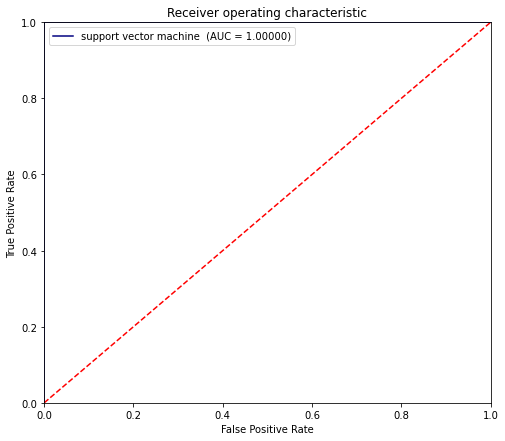

In [7]:
auc = roc_auc_score(y_test, Y_pred_proba[:,1])
print (auc)
fpr, tpr, thresholds = roc_curve(y_test, Y_pred_proba[:,1])
plt.figure(figsize=(8,7))
plt.plot(fpr, tpr, color="navy", linestyle="solid", label = 'support vector machine  (AUC = %0.5f)' % auc)
plt.plot( [0, 1], [0, 1], color="red", linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend()
plt.show()

In [8]:
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils import shuffle



### Why are one of the correlated attributes being removed? 

correlated traits have almost identical influence on the dependent variable. 

correlated variables will not enhance our model and will most likely degrade it,

thus we should only use one of them. 

also fewer features lead to faster learning and a more straightforward model (model with fewer features)

In [9]:

# >> FEATURE SELECTION << #
def remove_correlated_features(X):
    threshold = 0.9
    #if the feature correlation is more than the threshold then it will be dropped
    correlation_matrix = X.corr()
    #correlation matrix of the features 
    drop_columns = np.full(correlation_matrix.shape[0], False, dtype=bool)
    #creating a 1d arry of the features, having it filled with false as it hasnt been decided to be dropped yet
    
    #loop over the correlation_matrix elements(only the upper above the diagonal elements) 
    #if any of them are more than 0.9 the drop_columns updates that element to true
    for i in range(correlation_matrix.shape[0]):
        for j in range(i + 1, correlation_matrix.shape[0]):
            if correlation_matrix.iloc[i, j] >= threshold:
                drop_columns[j] = True
    columns_dropped = X.columns[drop_columns]
    
    #dropping the coorelated elements
    X.drop(columns_dropped, axis=1, inplace=True)
    return columns_dropped



### how to remove unimportat features? 

p-values assist us in identifying the characteristics that are most important in explaining trends in the dependent variable (y).

A characteristic with a low p-value has more relevance in explaining Y trends,

whereas a feature with a high p-value has less. 

Typically, a Significance Level (threshold) is specified, and any characteristic with a p-value greater than this level is removed. the method used is Backward Elimination 

### Backward Elimination used in remove_less_significant_features

Step 1: To stay in the model, we must first choose a significance level. (0.05)

Step 2: Complete the model by include all potential  independent variables.

Step 3: Select the predictor with the greatest P-value, for example.

If the P-value is greater than the SL, go to step 4.

Otherwise, finish, and our model is complete.

Step 4: Get rid of the predictor.

Step 5: Rebuild the model with the remaining variables and fit it.

In [15]:
def remove_less_significant_features(X, Y):
    regression_ols = None
    columns_dropped = np.array([])
    for itr in range(0, len(X.columns)):
        
        #model chosen is Ordinary Least Squares
        ols = sm.OLS(Y, X).fit()
        max_col = ols.pvalues.idxmax()
        max_val = ols.pvalues.max()
        if max_val > 0.05:
            X.drop(max_col, axis='columns', inplace=True)
            columns_dropped = np.append(columns_dropped, [max_col])
        else:
            break
    ols.summary()
    return columns_dropped



## linear SVM

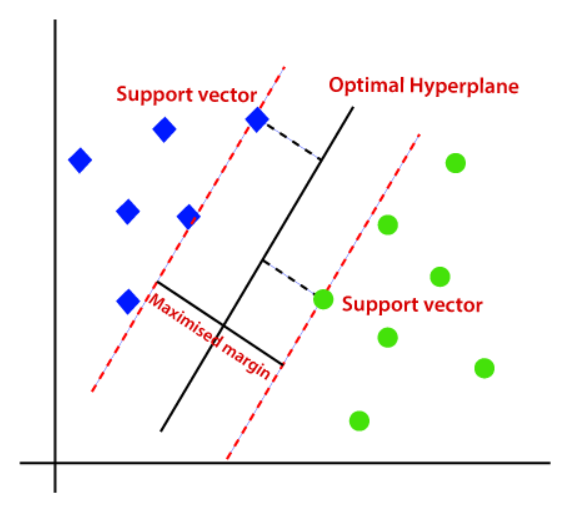

Our objective is to find a hyperplane that separates +ve and -ve examples with the largest margin while keeping the misclassification as low as possible



# SVM code theory

 xi.w + b <= -1   if yi = -1 (belongs to -ve class)
 
 xi.w + b >= +1	if yi = +1 (belongs to +ve class)
 
 			or
            
  	__yi(xi.w+b) >= 1__
    
    
for all support vectors(SV) (data points which decides margin)

  xi.w+b = -1    here xi is -ve SV and yi is -1
  
  xi.w+b = +1    here xi is +ve SV and yi is +1
  
For decision Boundary yi(xi.w+b)=0 here xi belongs to point in decision boundary

Our Objective is to maximize Width W

W = ((X+ - X-).w)/|w|

or we can say minimize |w|

Once we have found optimized w and b using algorithm

x.w+b = 1 is line passing through +ve support vectors

x.w+b = -1 is line passing through -ve support vectors

x.w+b = 0 is decision boundary

It is not necessary that support vector lines always pass through support vectors

It is a Convex Optimization problem and will always lead to a global minimum

This is Linear SVM means kernel is linear

Start with random value of w say(w0,w0) we will decrease it later

Select step size as w0*0.1

A small value of b, we will increase it later

b will range from (-b0 < b < +b0, step = step*b_multiple)

We will check for points xi in dataset:

Check will for all transformation of w like (w0,w0), (-w0,w0), (w0,-w0), (-w0,-w0)

if not yi(xi.w+b)>=1 for all points then break

Else find |w| and put it in dictionary as key and (w,b) as values

If w<=0 then current step have been completed and go to step 6

Else decrease w as (w0-step,w0-step) and continue with step 3

Do this step until step becomes w0*0.001 because futher it will be point of expense

step = step*0.1

go to step 3

Select (w,b) which has min |w| form the dictionary


### We will minimize the cost/objective function shown below:

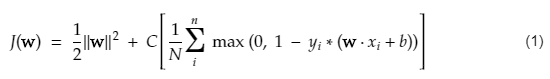

In the training phase, Larger C results in the narrow margin (for infinitely large C the SVM becomes hard margin) and smaller C results in the wider margin.


In [16]:
# >> MODEL TRAINING << #
#note y intercept is in the weight vector
def compute_cost(W, X, Y):
    # calculate hinge loss
    N = X.shape[0]
    distances = 1 - Y * (np.dot(X, W))
    distances[distances < 0] = 0  # equivalent to max(0, distance)
    hinge_loss = regularization_strength * (np.sum(distances) / N)

    # calculate cost
    cost = 1 / 2 * np.dot(W, W) + hinge_loss
    return cost

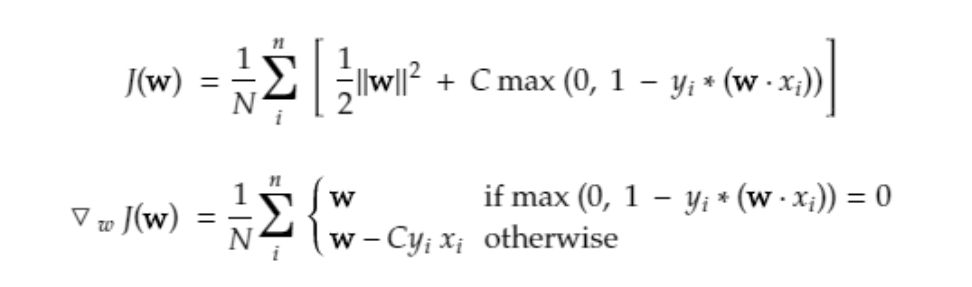
first half of equation Minimize ∣∣w∣∣² which maximizes margin (2/∣∣w∣∣)

second half of the equation Minimize the sum of hinge loss which minimizes misclassifications


In [17]:
def calculate_cost_gradient(W, X_batch, Y_batch):
    # if only one example is passed (eg. in case of SGD)
    if type(Y_batch) == np.float64:
        Y_batch = np.array([Y_batch])
        X_batch = np.array([X_batch])  # gives multidimensional array

    distance = 1 - (Y_batch * np.dot(X_batch, W))
    dw = np.zeros(len(W))

    for ind, d in enumerate(distance):
        if max(0, d) == 0:
            di = W
        else:
            di = W - (regularization_strength * Y_batch[ind] * X_batch[ind])
        dw += di

    dw = dw/len(Y_batch)  # average
    return dw


minimize the objective fn

using Stochastic Gradient Descent or SGD.
thus only using one example per iteration

steps

Find the gradient of cost function i.e. ∇J(w’)

Move opposite to the gradient by a certain rate i.e. w’ = w’ — ∝(∇J(w’))

Repeat step 1–3 until convergence i.e we found w’ where J(w) is smallest


## stopping criteria

when the current cost hasn’t decreased much as compared to the previous cost. 
or  when epochs  are more than 6000 as it would be to muh omputation

In [18]:

def sgd(features, outputs):
    max_epochs = 6000
    weights = np.zeros(features.shape[1])
    nth = 0
    prev_cost = float("inf")
    cost_threshold = 0.01  # in percent
    # stochastic gradient descent
    for epoch in range(1, max_epochs):
        # shuffle to prevent repeating update cycles
        X, Y = shuffle(features, outputs)
        for ind, x in enumerate(X):
            ascent = calculate_cost_gradient(weights, x, Y[ind])
            weights = weights - (learning_rate * ascent)

        # convergence check on 2^nth epoch
        if epoch == 2 ** nth or epoch == max_epochs - 1:
            cost = compute_cost(weights, features, outputs)
            print("Epoch is: {} and Cost is: {}".format(epoch, cost))
            # stoppage criterion
            
            
            if abs(prev_cost - cost) < cost_threshold * prev_cost:
                return weights
            prev_cost = cost
            nth += 1
    return weights


### Preprocessing data

In [19]:
data = pd.read_csv('data.csv')
diag_map = {1: 1.0, 0: -1.0}
data['result'] = data['result'].map(diag_map)

Y = data.loc[:, 'result']
X = data.iloc[:, 1:]

# filter features
remove_correlated_features(X)
remove_less_significant_features(X, Y)

print(X.head())
# normalize data for better convergence and to prevent overflow
X_normalized = MinMaxScaler().fit_transform(X.values)
X = pd.DataFrame(X_normalized)

# insert 1 in every row for intercept b
X.insert(loc=len(X.columns), column='intercept', value=1)

# split data 
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, random_state=42)


   country  symptom4  result
0        8        12     1.0
1        8        12    -1.0
2        8        12    -1.0
3        8        12    -1.0
4        8        12    -1.0


In [20]:
def cross_validation( k, datax,datay):
    """
    k : k-fold size
    data: training data
    """
    accuracies1 = []
    f1scores=[]
    
    # data shuffle
    data.sample(frac=1)

    fold=int(datax.shape[0]/k)

    for j in range(k):
        xtest = datax[j*fold:j*fold+fold]
        xtrain = datax[~datax.index.isin(xtest.index)]
        
        ytest = datay[j*fold:j*fold+fold]
        ytrain = datay[~datay.index.isin(ytest.index)]
        
        W = sgd(xtrain.to_numpy(), ytrain.to_numpy())
        y_test_predicted = np.array([])
        
        for i in range(xtest.to_numpy().shape[0]):
            yp = np.sign(np.dot(xtest.to_numpy()[i], W))
            y_test_predicted = np.append(y_test_predicted, yp)
        f1scores.append(f1_score(ytest.to_numpy(), y_test_predicted))
        accuracies1.append(accuracy_score(ytest.to_numpy(), y_test_predicted))

            




    return np.array(accuracies1).mean(),np.array(f1scores).mean()

In [21]:
accuracy=[]
f1=[]

for regularization_strength in [0.1, 1, 10, 100, 1000]:
    for learning_rate in [0.000001,0.00001,0.0001]:
       
        acc,f11=cross_validation( 10, X_train,y_train)
        accuracy.append(acc)
        f1.append(f11)
        print("f1scores on test dataset: {} \n".format(f11))
        print("accuracy on test dataset: {} \n".format(acc))

Epoch is: 1 and Cost is: 0.09999087586545463
Epoch is: 2 and Cost is: 0.09998176434570498
Epoch is: 1 and Cost is: 0.09999108853409425
Epoch is: 2 and Cost is: 0.09998218961974234
Epoch is: 1 and Cost is: 0.0999912912266625
Epoch is: 2 and Cost is: 0.099982594488511
Epoch is: 1 and Cost is: 0.09999090987152941
Epoch is: 2 and Cost is: 0.09998183249173945
Epoch is: 1 and Cost is: 0.09999119137383347
Epoch is: 2 and Cost is: 0.09998239508536653
Epoch is: 1 and Cost is: 0.0999907443920673
Epoch is: 2 and Cost is: 0.09998150164306761
Epoch is: 1 and Cost is: 0.09999083175923672
Epoch is: 2 and Cost is: 0.09998167627580386
Epoch is: 1 and Cost is: 0.09999094220257618
Epoch is: 2 and Cost is: 0.09998189719692827
Epoch is: 1 and Cost is: 0.09999065923772746
Epoch is: 2 and Cost is: 0.09998133150108227
Epoch is: 1 and Cost is: 0.09999146121377257
Epoch is: 2 and Cost is: 0.09998293438907642
f1scores on test dataset: 0.0 

accuracy on test dataset: 0.8727272727272727 

Epoch is: 1 and Cost is: 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.8727272727272727, 0.8727272727272727, 0.8727272727272727, 0.8727272727272727, 0.8727272727272727, 0.8727272727272727, 0.8727272727272727, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


Text(0, 0.5, 'f1 score')

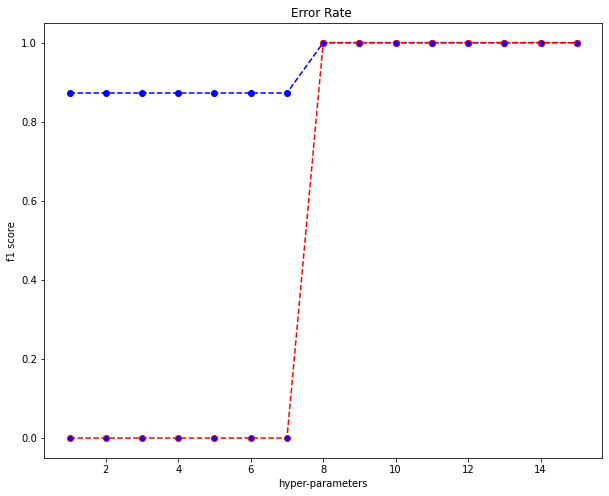

In [22]:
plt.figure(figsize=(10, 8))
print(f1)
print(accuracy)

plt.plot(range(1, 16), accuracy , color='blue', linestyle='dashed', marker='o', markerfacecolor='blue')

plt.plot(range(1, 16), f1, color='red', linestyle='dashed', marker='o', markerfacecolor='blue')
plt.title('Error Rate ')
plt.xlabel('hyper-parameters')
plt.ylabel('f1 score')

as seen through the cross validation 

the best c is 10
the best  ∝ is 0.00001

Epoch is: 1 and Cost is: 9.008530236153089
Epoch is: 2 and Cost is: 8.032424633567272
Epoch is: 4 and Cost is: 6.12477174399525
Epoch is: 8 and Cost is: 2.8931582275858365
Epoch is: 16 and Cost is: 2.6765895181168373
Epoch is: 32 and Cost is: 2.5244425985728776
Epoch is: 64 and Cost is: 2.31516260457794
Epoch is: 128 and Cost is: 2.109752985173825
Epoch is: 256 and Cost is: 2.0136196796946373
Epoch is: 512 and Cost is: 1.998762625856857
1.0


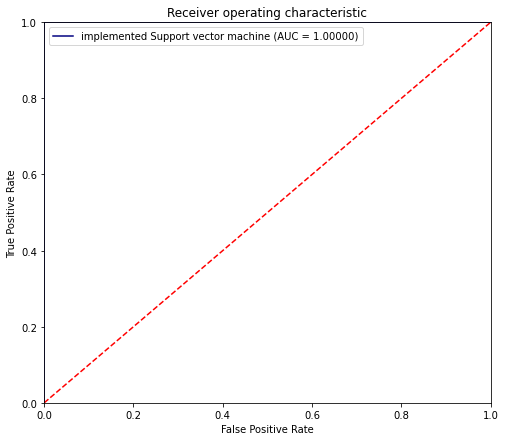

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00        77
         1.0       1.00      1.00      1.00        10

    accuracy                           1.00        87
   macro avg       1.00      1.00      1.00        87
weighted avg       1.00      1.00      1.00        87



In [23]:
regularization_strength = 10
learning_rate = 0.00001
W = sgd(X_train.to_numpy(), y_train.to_numpy())

# testing phase
y_test_predicted = np.array([])
for i in range(X_test.shape[0]):
    yp = np.sign(np.dot(X_test.to_numpy()[i], W))
    y_test_predicted = np.append(y_test_predicted, yp)


fpr, tpr, thresholds = roc_curve(y_test,y_test_predicted)
auc = roc_auc_score(y_test, y_test_predicted)

print (auc)

plt.figure(figsize=(8,7))
plt.plot(fpr, tpr, color="navy", linestyle="solid", label = 'implemented Support vector machine (AUC = %0.5f)' % auc)
plt.plot( [0, 1.0], [0, 1.0], color="red", linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend()
plt.show()
print(classification_report(y_test, y_test_predicted))



# Decision tree

In [24]:
%matplotlib inline
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import  auc

In [25]:
df = pd.read_csv('data.csv',index_col=0)  
df.head()

,location,country,gender,age,vis_wuhan,from_wuhan,symptom1,symptom2,symptom3,symptom4,symptom5,symptom6,diff_sym_hos,result
0,104,8,1,66.0,1,0,14,31,19,12,3,1,8,1
1,101,8,0,56.0,0,1,14,31,19,12,3,1,0,0
2,137,8,1,46.0,0,1,14,31,19,12,3,1,13,0
3,116,8,0,60.0,1,0,14,31,19,12,3,1,0,0
4,116,8,1,58.0,0,0,14,31,19,12,3,1,0,0


Text(0.5, 1.0, 'Correlation Matrix of one hot encoded dataset')

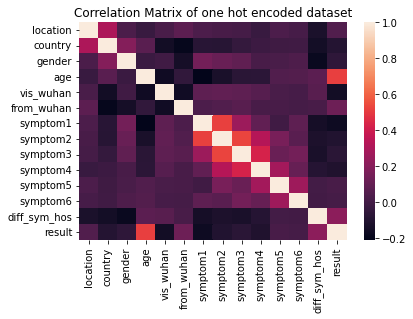

In [26]:
# correlation matrix
sns.heatmap(df.corr())
plt.title('Correlation Matrix of one hot encoded dataset')

In [27]:
#One hot Encoding
import category_encoders as ce

encoder = ce.OneHotEncoder(cols=['country', 'location'])
df = encoder.fit_transform(df)

#normalized_df=(df-df.mean())/df.std()

df=(df-df.min())/(df.max()-df.min())
df

,location_1,location_2,location_3,location_4,location_5,location_6,location_7,location_8,location_9,location_10,...,vis_wuhan,from_wuhan,symptom1,symptom2,symptom3,symptom4,symptom5,symptom6,diff_sym_hos,result
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.65,1.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.90,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,1.0
859,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
860,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
861,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0


Text(0.5, 1.0, 'Correlation Matrix of dataset')

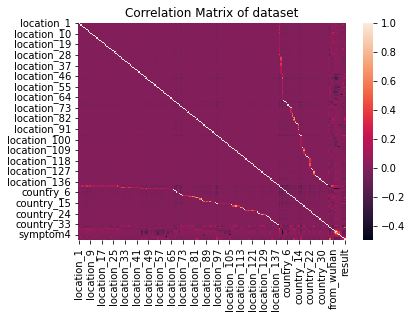

In [28]:
# correlation matrix
sns.heatmap(df.corr())
plt.title('Correlation Matrix of dataset')


## Data Analysis

In [29]:
len(df)

863

In [30]:
df.shape

(863, 185)

In [31]:
df.head()

,location_1,location_2,location_3,location_4,location_5,location_6,location_7,location_8,location_9,location_10,...,vis_wuhan,from_wuhan,symptom1,symptom2,symptom3,symptom4,symptom5,symptom6,diff_sym_hos,result
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.65,1.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.90,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25,0.0


In [32]:
df.describe()

,location_1,location_2,location_3,location_4,location_5,location_6,location_7,location_8,location_9,location_10,...,vis_wuhan,from_wuhan,symptom1,symptom2,symptom3,symptom4,symptom5,symptom6,diff_sym_hos,result
count,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,...,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000,863.000000
mean,0.001159,0.002317,0.001159,0.025492,0.001159,0.009270,0.020857,0.002317,0.022016,0.003476,...,0.181924,0.107764,0.505794,0.903301,0.963103,0.986674,0.997683,0.998841,0.299768,0.125145
std,0.034040,0.048112,0.034040,0.157707,0.034040,0.095889,0.142990,0.048112,0.146821,0.058891,...,0.386005,0.310261,0.166578,0.241072,0.150740,0.098648,0.042417,0.034040,0.117938,0.331075
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.583333,1.000000,1.000000,1.000000,1.000000,1.000000,0.250000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.583333,1.000000,1.000000,1.000000,1.000000,1.000000,0.250000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.583333,1.000000,1.000000,1.000000,1.000000,1.000000,0.300000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [33]:
#feature_cols = ["location","country","gender","age","vis_wuhan","from_wuhan","symptom1","symptom2", "symptom3","symptom4","symptom5", "symptom6","diff_sym_hos"]
#X = df[feature_cols]
Y = df['result']
X = df.drop(columns = ['result']).copy()
X

,location_1,location_2,location_3,location_4,location_5,location_6,location_7,location_8,location_9,location_10,...,age,vis_wuhan,from_wuhan,symptom1,symptom2,symptom3,symptom4,symptom5,symptom6,diff_sym_hos
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.680851,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.65
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.574468,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.468085,0.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.90
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.617021,1.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.595745,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.234043,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
859,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.351064,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
860,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.504255,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25
861,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.504255,0.0,0.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.25


In [34]:
def gini_impurity(y):
    p = y.value_counts()/y.shape[0]
    gini = np.sum(p**2)
    return(gini)

print("Gender Gini index = ",gini_impurity(df.gender))
print("From Wuhan Gini index = ",gini_impurity(df.from_wuhan))
print("Age Gini index = ",gini_impurity(df.age))
print("Visited Wuhan Gini index = ",gini_impurity(df.vis_wuhan))
print("Symptom1 Gini index = ",gini_impurity(df.symptom1))
print("Symptom2 Gini index = ",gini_impurity(df.symptom2))
print("Symptom3 Gini index = ",gini_impurity(df.symptom3))
print("Symptom4 Gini index = ",gini_impurity(df.symptom4))
print("Symptom5 Gini index = ",gini_impurity(df.symptom5))
print("Symptom6 Gini index = ",gini_impurity(df.symptom6))
print("Diff_sym_hos Gini index = ",gini_impurity(df.diff_sym_hos))


Gender Gini index =  0.36536026606907646
From Wuhan Gini index =  0.807698762972143
Age Gini index =  0.08481690295917259
Visited Wuhan Gini index =  0.7023452909559877
Symptom1 Gini index =  0.5863415367718043
Symptom2 Gini index =  0.7085780960270903
Symptom3 Gini index =  0.8662135507788319
Symptom4 Gini index =  0.9564992635300341
Symptom5 Gini index =  0.9930636210690831
Symptom6 Gini index =  0.9976851882932829
Diff_sym_hos Gini index =  0.5432301827815067


In [35]:
from scipy.stats import entropy
from math import log, e
def entropy(labels, base=None):
    value,counts = np.unique(labels, return_counts=True)
    norm_counts = counts / counts.sum()
    base = e if base is None else base
    return -(norm_counts * np.log(norm_counts)/np.log(base)).sum()
print("Gender Entropy = ",entropy(df.gender))
print("From Wuhan Entropy = ",entropy(df.from_wuhan))
print("Age Entropy = ",entropy(df.age))
print("Visited Wuhan Entropy = ",entropy(df.vis_wuhan))
print("Symptom1 Entropy = ",entropy(df.symptom1))
print("Symptom2 Entropy = ",entropy(df.symptom2))
print("Symptom3 Entropy = ",entropy(df.symptom3))
print("Symptom4 Entropy = ",entropy(df.symptom4))
print("Symptom5 Entropy = ",entropy(df.symptom5))
print("Symptom6 Entropy = ",entropy(df.symptom6))
print("Diff_sym_hos Entropy = ",entropy(df.diff_sym_hos))

Gender Entropy =  1.0480735857222458
From Wuhan Entropy =  0.3418139387126231
Age Entropy =  3.434192340864289
Visited Wuhan Entropy =  0.47429771644853425
Symptom1 Entropy =  0.9166300021583464
Symptom2 Entropy =  0.8308669146769485
Symptom3 Entropy =  0.43460196032200105
Symptom4 Entropy =  0.15875998180116652
Symptom5 Entropy =  0.02697105869305029
Symptom6 Entropy =  0.008991697674269807
Diff_sym_hos Entropy =  1.1707227651735064


In [36]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2,random_state = 60, shuffle = True)
X_train.shape, X_test.shape


((690, 184), (173, 184))

No stratify is needed as the testing value has a considerate ratio of zeroes and ones as the training sample

In [37]:
Y_train,Y_validate = train_test_split(Y_train, test_size = 0.17, random_state = 50, shuffle = True)
X_train, X_validate = train_test_split(X_train, test_size = 0.17, random_state = 50, shuffle = True)
X_train.shape, X_test.shape
#Y_train.shape, Y_validate.shape


((572, 184), (173, 184))

Splitting of training data into validation and testing to check hyperparameters on the validation part

### Features Scaling to consider if a feature has too much uncertainty

In [38]:
vw = X_test.from_wuhan.tolist()
length = len(vw)
print("Number of all samples in testing part: ",length)
counterzero = 0
counterone = 0
for i in range(length):
    if (vw[i] == 0.0):
        counterzero += 1
    else:
        counterone += 1

print("Number of zeros:",counterzero)
print("Number of ones:",counterone)

Number of all samples in testing part:  173
Number of zeros: 157
Number of ones: 16


In [39]:
fw = X_test.from_wuhan.tolist()
length = len(fw)
print("Number of all samples in testing part: ",length)
counterzero = 0
counterone = 0
for i in range(length):
    if (fw[i] == 0.0):
        counterzero += 1
    else:
        counterone += 1

print("Number of zeros:",counterzero)
print("Number of ones:",counterone)

Number of all samples in testing part:  173
Number of zeros: 157
Number of ones: 16


In [40]:
s5 = X_test.symptom5.tolist()
length = len(s5)
print("Number of all samples in testing part: ",length)
counterzero = 0
counterone = 0
for i in range(length):
    if (s5[i] == 0.0):
        counterzero += 1
    else:
        counterone += 1

print("Number of zeros:",counterzero)
print("Number of ones:",counterone)

Number of all samples in testing part:  173
Number of zeros: 0
Number of ones: 173


In [41]:
s6 = X_test.symptom6.tolist()
length = len(s6)
print("Number of all samples in testing part: ",length)
counterzero = 0
counterone = 0
for i in range(length):
    if (s6[i] == 0.0):
        counterzero += 1
    else:
        counterone += 1

print("Number of zeros:",counterzero)
print("Number of ones:",counterone)

Number of all samples in testing part:  173
Number of zeros: 1
Number of ones: 172


In [42]:
error = [] 
for i in range(1, 10):
    dtc = DecisionTreeClassifier(criterion = 'gini',max_depth = i) 
    dtc.fit(X_train, Y_train)
    Y_pred = dtc.predict(X_validate) 
    error.append(np.mean(Y_pred != Y_validate))

Text(0, 0.5, 'Mean Error')

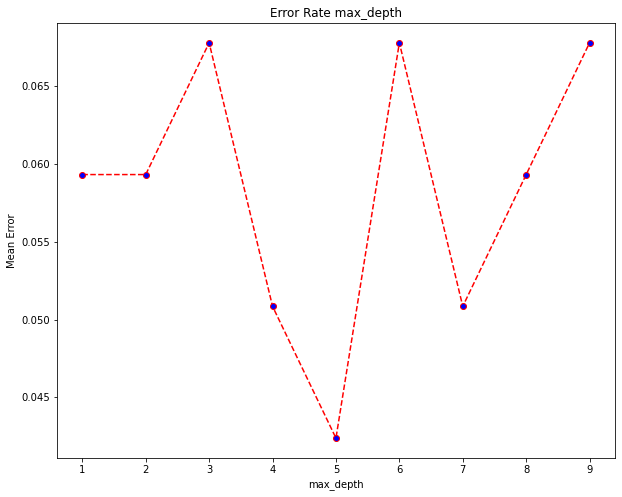

In [43]:
plt.figure(figsize=(10, 8))
plt.plot(range(1, 10), error, color='red', linestyle='dashed', marker='o', markerfacecolor='blue')
plt.title('Error Rate max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Error')

From the plot, maximum depth = 5, 6, 7, 8 or 9 would produce the lowest error so we will see the best hyperparameter using the grid search

In [44]:
error = [] 
for i in range(2, 10):
    dtc = DecisionTreeClassifier(criterion = 'gini',min_samples_split = i) 
    dtc.fit(X_train, Y_train)
    Y_pred = dtc.predict(X_validate) 
    error.append(np.mean(Y_pred != Y_validate))

Text(0, 0.5, 'Mean Error')

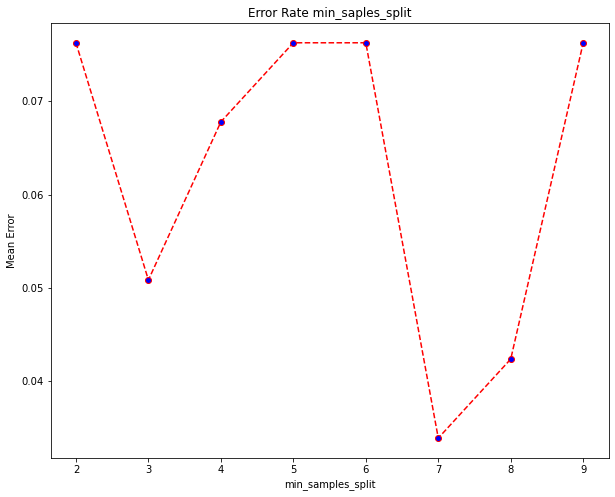

In [45]:
plt.figure(figsize=(10, 8))
plt.plot(range(2, 10), error, color='red', linestyle='dashed', marker='o', markerfacecolor='blue')
plt.title('Error Rate min_saples_split')
plt.xlabel('min_samples_split')
plt.ylabel('Mean Error')

From the plot, minimum samples split could be 2. This number will be checked using the grid search

## Train model and Predict

In [46]:
dtclassifier = DecisionTreeClassifier(random_state = 42)
dtclassifier.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=42)

In [47]:
#Tuning hyperparameters to choose the most accurate ones
grid = dict(criterion = ['entropy', 'gini'],max_depth = [2,4,5,6,7,8,9,10],
            min_samples_split = [4,5,7,10])

CV = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state= 50)

hyper_search = GridSearchCV(estimator = dtclassifier, param_grid = grid, cv = CV)

hyperparameter = hyper_search.fit(X_train, Y_train)

# Print the most fitting hyperparameters with the highest accuracy
print("Best score: %f using %s" % (hyperparameter.best_score_, hyperparameter.best_params_))

Best score: 0.961575 using {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 7}


In [48]:
#Print all hyperparameters checked
means = hyperparameter.cv_results_['mean_test_score']
stds = hyperparameter.cv_results_['std_test_score']
parameters = hyperparameter.cv_results_['params']
for i, j, k in zip(means, stds, parameters):
    print("%f (%f) with: %r" % (i, j, k))

0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 4}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 5}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 7}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 10}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 4}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 5}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 7}
0.934755 (0.022471) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 10}
0.940573 (0.024941) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 4}
0.942317 (0.026304) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5}
0.941742 (0.026355) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 

## Train a gini model and Predict using the best hyperparameters

In [49]:
dtclassifier = DecisionTreeClassifier(criterion = 'gini',max_depth = 8, min_samples_split = 2,random_state = 42)
dtclassifier.fit(X_train, Y_train)
Y_pred = dtclassifier.predict(X_test)

In [50]:
Y_proba = dtclassifier.predict_proba(X_test)[::,1]
Y_proba

array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0.])

In [51]:
print("The predicted accuracy is {}".format(accuracy_score(Y_test, Y_pred)))

The predicted accuracy is 0.953757225433526


## Displaying the actual labels against the predicted

In [52]:
data_p = pd.DataFrame({"Actual":Y_test,"Predicted":Y_pred})
data_p

,Actual,Predicted
682,0.0,0.0
253,1.0,1.0
589,0.0,0.0
160,0.0,0.0
462,0.0,0.0
...,...,...
814,0.0,0.0
0,1.0,0.0
536,0.0,0.0
102,0.0,0.0


Compare actual with predicted results

In [53]:
print('Test Results: ',Y_test.tolist())
print('Predicted Results: ',Y_pred.tolist())

Test Results:  [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
Predicted Results:  [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

### As shown above most of the predictons results are 0 (negative) which are predicted right. That's why True negatives have the greatest value

In [54]:
print(classification_report(Y_test,Y_pred))

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97       150
         1.0       0.78      0.91      0.84        23

    accuracy                           0.95       173
   macro avg       0.88      0.94      0.91       173
weighted avg       0.96      0.95      0.96       173



### Precision = TP / (TP + FP)
#### Precision represents the ratio of positive samples predicted right of all positive samples and it is 0.99 in the 0 class as most of the predicted values were 0 and most of them are actually right. However the 1 class was only predicted 27 times which was predicted right only 21 times

### Recall = TP / (TP + FN)
#### Recall represents the ratio of positive samples predicted right of all actual samples and it is too many in the 0 class as there are too many predicted 0 values which are right and very few false negatives around (2).

In [55]:
print(confusion_matrix(Y_test,Y_pred))

[[144   6]
 [  2  21]]


In [56]:
auc = roc_auc_score(Y_test, Y_proba)
print (auc)

0.9365217391304348


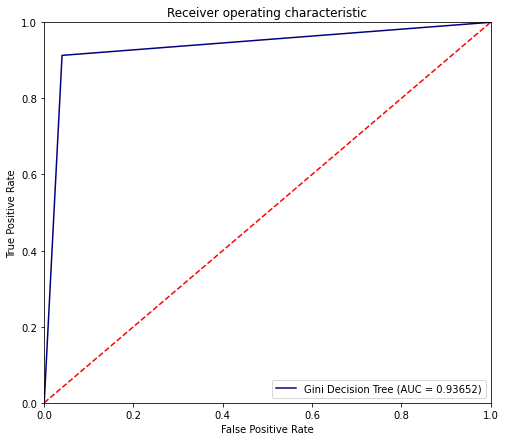

In [57]:
fpr, tpr, thresholds = roc_curve(Y_test,Y_proba)
plt.figure(figsize=(8,7))
plt.plot(fpr, tpr, color="navy", linestyle="solid", label = 'Gini Decision Tree (AUC = %0.5f)' % auc)
plt.plot( [0, 1.0], [0, 1.0], color="red", linestyle="--")
plt.xlim([0, 1.0])
plt.ylim([0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend()
plt.show()

# Visualize Decision tree

In [58]:
!pip install pydotplus

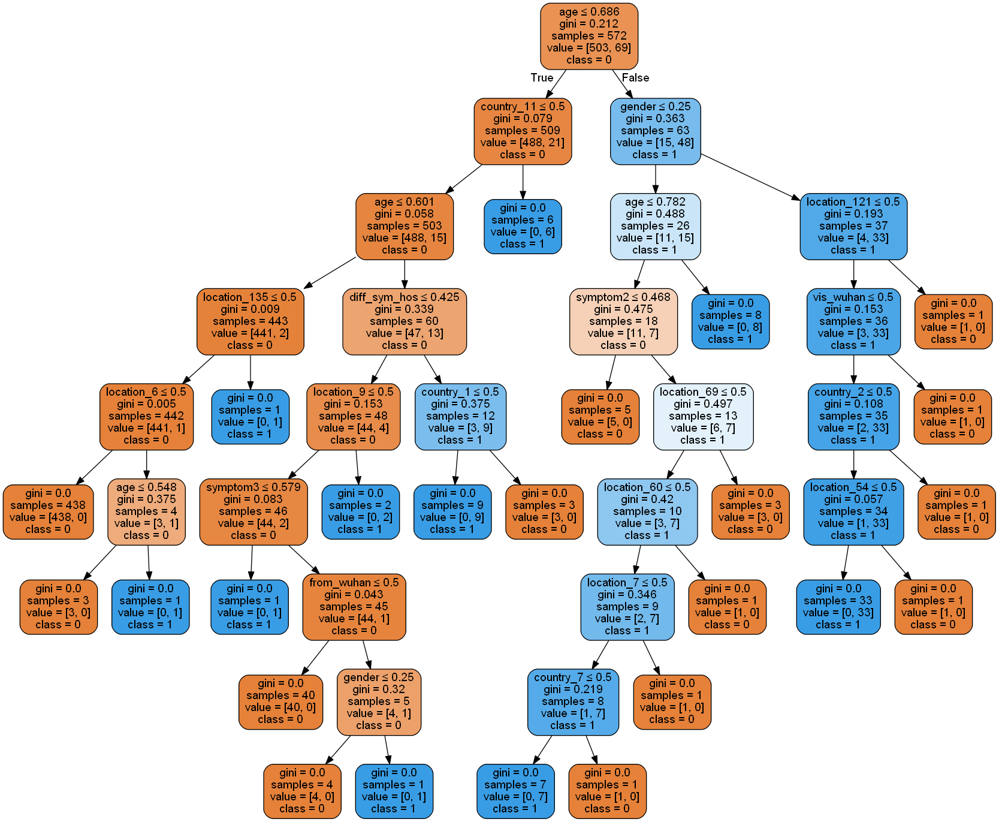

In [59]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(dtclassifier, out_file = dot_data, rounded = True, filled = True,
                special_characters = True, feature_names = X.columns, class_names = ["0","1"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png("Covid-19.png")
Image(graph.create_png())

The best starting split was age feature as it has the lowest gini impurity as calculated above

## Draw Decision Tree using entropy

In [60]:
error = [] 
for i in range(1, 10):
    dtc = DecisionTreeClassifier(criterion = 'entropy',max_depth = i) 
    dtc.fit(X_train, Y_train)
    Y_pred = dtc.predict(X_validate) 
    error.append(np.mean(Y_pred != Y_validate))

Text(0, 0.5, 'Mean Error')

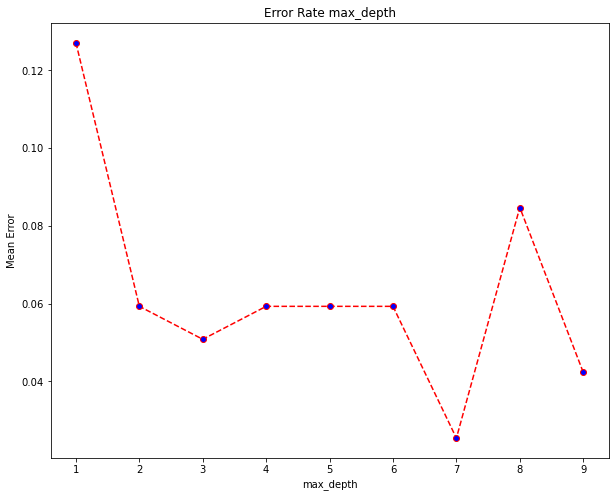

In [61]:
plt.figure(figsize=(10, 8))
plt.plot(range(1, 10), error, color='red', linestyle='dashed', marker='o', markerfacecolor='blue')
plt.title('Error Rate max_depth')
plt.xlabel('max_depth')
plt.ylabel('Mean Error')

Maximum depth of 9 has the lowest mean error rate but that could make overitting to the tree and the rest numbers of maximum depth 3, 5, 6 and 8 are close to each other so from the best hyperparameters models using entropy it will be max_depth = 8

In [62]:
error = [] 
for i in range(2, 10):
    dtc = DecisionTreeClassifier(criterion = 'entropy',max_depth = i) 
    dtc.fit(X_train, Y_train)
    Y_pred = dtc.predict(X_validate) 
    error.append(np.mean(Y_pred != Y_validate))

Text(0, 0.5, 'Mean Error')

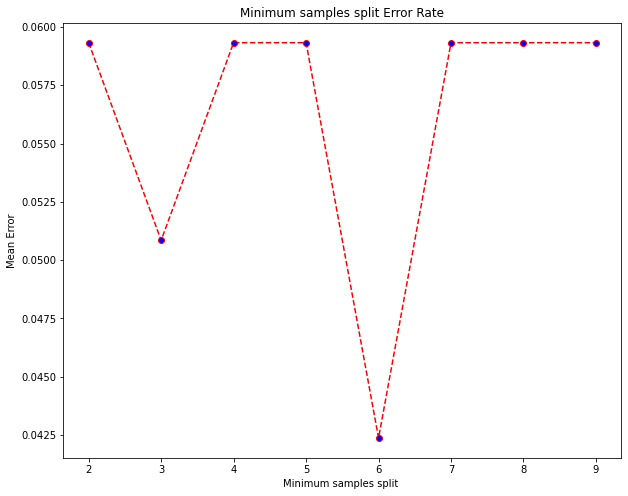

In [63]:
plt.figure(figsize=(10, 8))
plt.plot(range(2, 10), error, color='red', linestyle='dashed', marker='o', markerfacecolor='blue')
plt.title('Minimum samples split Error Rate')
plt.xlabel('Minimum samples split ')
plt.ylabel('Mean Error')

Minimum samples split of 3 or 5 produce the lowest mean error so we chose 5 samples split

In [64]:
#Print all hyperparameters checked
means = hyperparameter.cv_results_['mean_test_score']
stds = hyperparameter.cv_results_['std_test_score']
parameters = hyperparameter.cv_results_['params']
for i, j, k in zip(means, stds, parameters):
    print("%f (%f) with: %r" % (i, j, k))

0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 4}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 5}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 7}
0.930056 (0.020738) with: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 10}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 4}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 5}
0.935330 (0.023449) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 7}
0.934755 (0.022471) with: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 10}
0.940573 (0.024941) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 4}
0.942317 (0.026304) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5}
0.941742 (0.026355) with: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 

In [65]:
# Create and train a model using entropy and the best hypermarameters 
entropyclassifier = DecisionTreeClassifier(criterion = 'entropy', max_depth = 8, min_samples_split = 5,random_state = 42)
entropyclassifier.fit(X_train, Y_train)
Y_pred2 = entropyclassifier.predict(X_test)

In [66]:
Y_proba2 = entropyclassifier.predict_proba(X_test)[::,1]
Y_proba2

array([0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.5 , 0.  , 0.05, 0.  , 1.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 1.  ,
       0.5 , 0.  , 0.  , 1.  , 0.05, 1.  , 0.  , 0.05, 0.  , 0.  , 0.  ,
       1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 1.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 1.  , 0.  , 0.  , 0.  , 0.  ,
       1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.05, 0.05, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 1.  , 0.  , 0.  , 0.  ,
       0.05, 0.  , 0.  , 0.  , 0.05, 0.  , 0.  , 0.  , 0.05, 1.  , 0.  ,
       1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.

In [67]:
data_p = pd.DataFrame({"Actual":Y_test,"Predicted":Y_pred2})
data_p

,Actual,Predicted
682,0.0,0.0
253,1.0,1.0
589,0.0,0.0
160,0.0,0.0
462,0.0,0.0
...,...,...
814,0.0,0.0
0,1.0,0.0
536,0.0,0.0
102,0.0,0.0


In [68]:
print("The predicted accuracy is {}".format(accuracy_score(Y_test, Y_pred2)))

The predicted accuracy is 0.9421965317919075


Gini indexed model produces higher accuracy than entropy as the data sample is numerical which is more suited by Gini

In [69]:
print(classification_report(Y_test,Y_pred2))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       150
         1.0       0.78      0.78      0.78        23

    accuracy                           0.94       173
   macro avg       0.87      0.87      0.87       173
weighted avg       0.94      0.94      0.94       173



In [70]:
auc = roc_auc_score(Y_test, Y_proba2)
print (auc)

0.9514492753623188


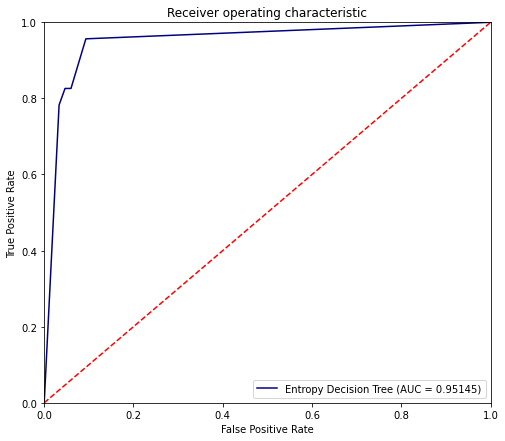

In [71]:
fpr, tpr, thresholds = roc_curve(Y_test,Y_proba2)
plt.figure(figsize=(8,7))
plt.plot(fpr, tpr, color="navy", linestyle="solid", label = 'Entropy Decision Tree (AUC = %0.5f)' % auc)
plt.plot( [0, 1.0], [0, 1.0], color="red", linestyle="--")
plt.xlim([0, 1.0])
plt.ylim([0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend()
plt.show()

<module 'sklearn.tree' from 'C:\\anaconda\\envs\\demonslayer\\lib\\site-packages\\sklearn\\tree\\__init__.py'>


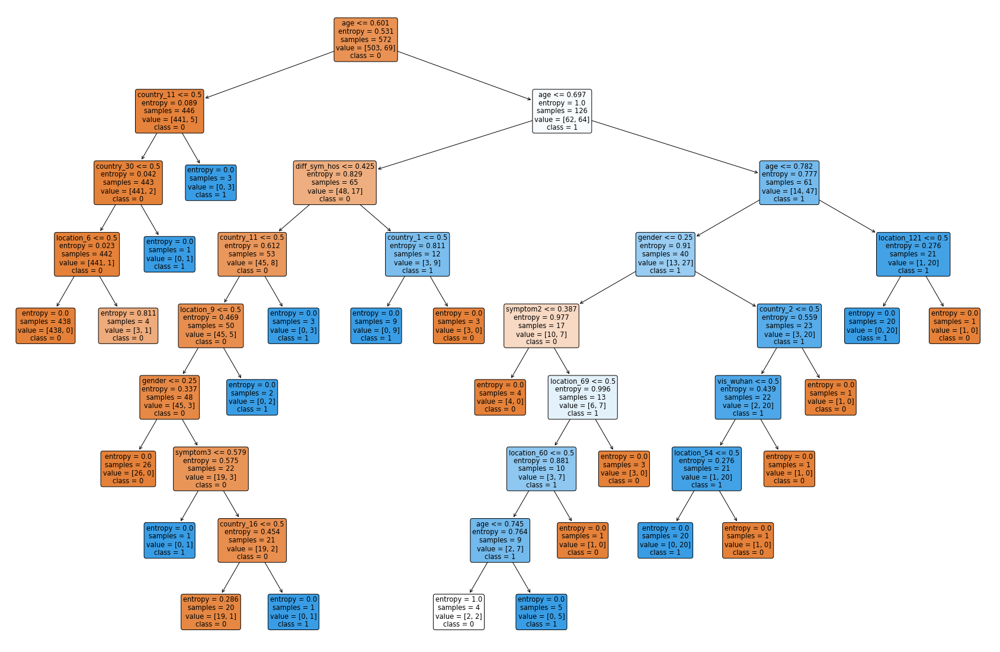

In [72]:
from sklearn import tree
fig = plt.figure(figsize=(30,20))
tree.plot_tree(entropyclassifier, feature_names= X.columns, class_names=["0","1"],filled=True, rounded = True)
print(tree)